### LOADING LIBRARIES

In [1]:
%matplotlib inline
%reload_ext autoreload
%autoreload 2
import warnings
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    warnings.warn("deprecated", DeprecationWarning)

In [2]:
import cv2
import os
import pandas as pd
import numpy as np
from tensorflow import keras as k
import matplotlib.pyplot as plt
from utils import *
from generator import *

### DATA LOADING

In [3]:
PATH = "./data"
TRAIN_CSV = "train.csv"
TEST_CSV = "valid.csv"

BATCH_SIZE=8
WEIGHT_FILENAME = "hair_segmentation_mobile.h5"


In [4]:
train_df = pd.read_csv(os.path.join(PATH, TRAIN_CSV))
test_df = pd.read_csv(os.path.join(PATH, TEST_CSV))

In [5]:
train_df.head()

,mask_filename,image_filename
0,./data/CelebAMask-HQ/CelebAMask-HQ-mask-anno/5...,./data/CelebAMask-HQ/CelebA-HQ-img/10453.jpg
1,./data/CelebAMask-HQ/CelebAMask-HQ-mask-anno/1...,./data/CelebAMask-HQ/CelebA-HQ-img/22210.jpg
2,./data/CelebAMask-HQ/CelebAMask-HQ-mask-anno/9...,./data/CelebAMask-HQ/CelebA-HQ-img/18942.jpg
3,./data/CelebAMask-HQ/CelebAMask-HQ-mask-anno/9...,./data/CelebAMask-HQ/CelebA-HQ-img/18846.jpg
4,./data/CelebAMask-HQ/CelebAMask-HQ-mask-anno/1...,./data/CelebAMask-HQ/CelebA-HQ-img/24745.jpg


In [6]:
test_df.head()

,mask_filename,image_filename
0,./data/CelebAMask-HQ/CelebAMask-HQ-mask-anno/1...,./data/CelebAMask-HQ/CelebA-HQ-img/20389.jpg
1,./data/CelebAMask-HQ/CelebAMask-HQ-mask-anno/2...,./data/CelebAMask-HQ/CelebA-HQ-img/5498.jpg
2,./data/CelebAMask-HQ/CelebAMask-HQ-mask-anno/7...,./data/CelebAMask-HQ/CelebA-HQ-img/15176.jpg
3,./data/CelebAMask-HQ/CelebAMask-HQ-mask-anno/0...,./data/CelebAMask-HQ/CelebA-HQ-img/986.jpg
4,./data/CelebAMask-HQ/CelebAMask-HQ-mask-anno/1...,./data/CelebAMask-HQ/CelebA-HQ-img/3392.jpg


In [7]:

test_generator = DataGenerator(test_df,
                               BATCH_SIZE,
                               input_size=192,
                               path='',
                               is_valid=True)

In [8]:
l = next(iter(test_generator))
l[0].shape,l[1].shape

((8, 192, 192, 3), (8, 192, 192, 2))

In [10]:
def plot_batch(im,bt=0,rw=2,cl=2,mask=False):
    fig, axes = plt.subplots(rw,cl, figsize=(7, 7))
    for i, ax in enumerate(axes.flat):
        if mask : ax = display_image(im[i+bt][...,0], ax=ax,cmap='gray')
        else : ax = display_image(im[i+bt], ax=ax)
    plt.tight_layout(pad=0.01)

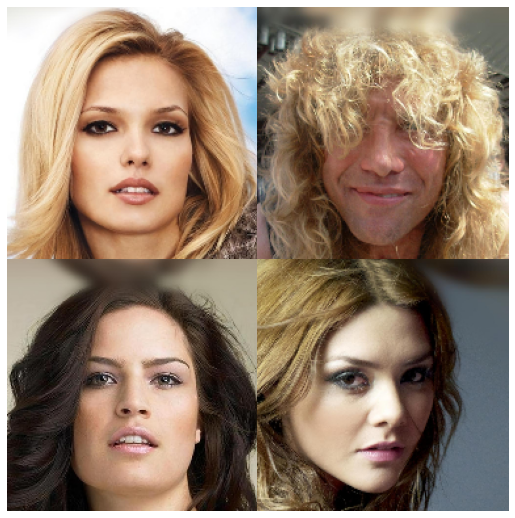

In [11]:
 plot_batch(l[0],bt=0,rw=2,cl=2)

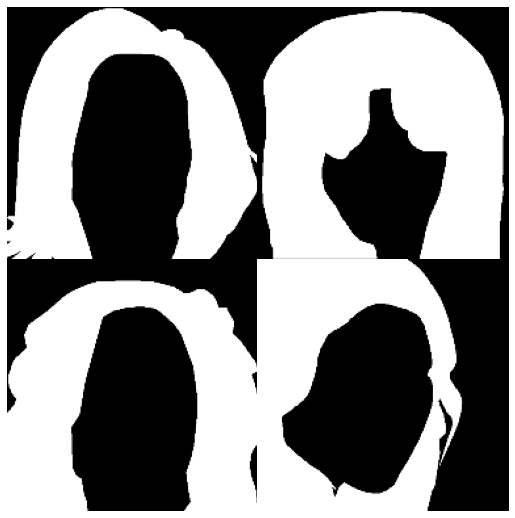

In [12]:
 plot_batch(l[1],bt=0,rw=2,cl=2,mask=True)

### PREDICTIONS

In [13]:

model = k.models.load_model(os.path.join('./weights',WEIGHT_FILENAME),compile=False)

In [50]:

test_images,test_labels = test_generator.__getitem__(10)
predictions = model.predict(test_images)


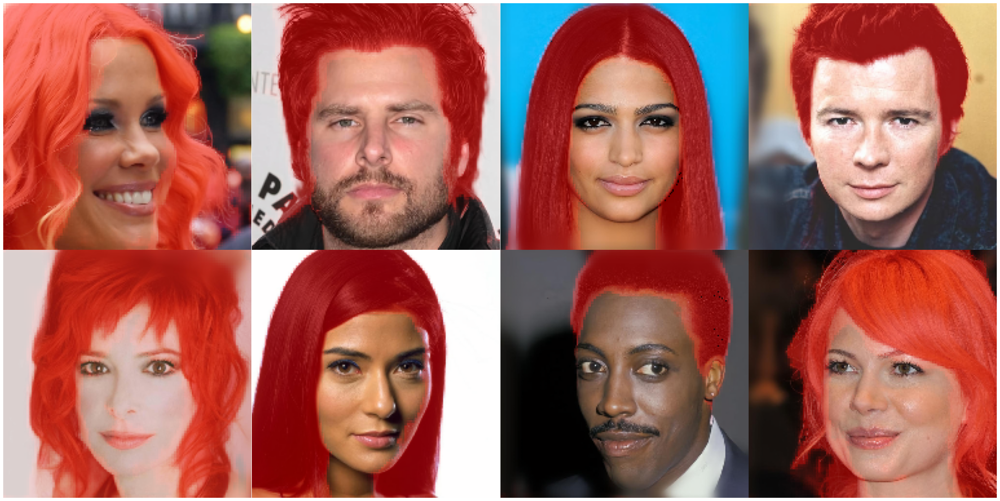

In [51]:
#Plotting predictions
fig, axes = plt.subplots(2, 4,figsize=(30, 15))
for i, ax in enumerate(axes.flat):
    ax = display_image(test_images[i], ax=ax)
    colored_hair = apply_color(test_images[i],predictions[i][...,0])
    display_image(colored_hair, ax=ax, alpha=0.5,cmap='gray')
plt.tight_layout(pad=0.1)

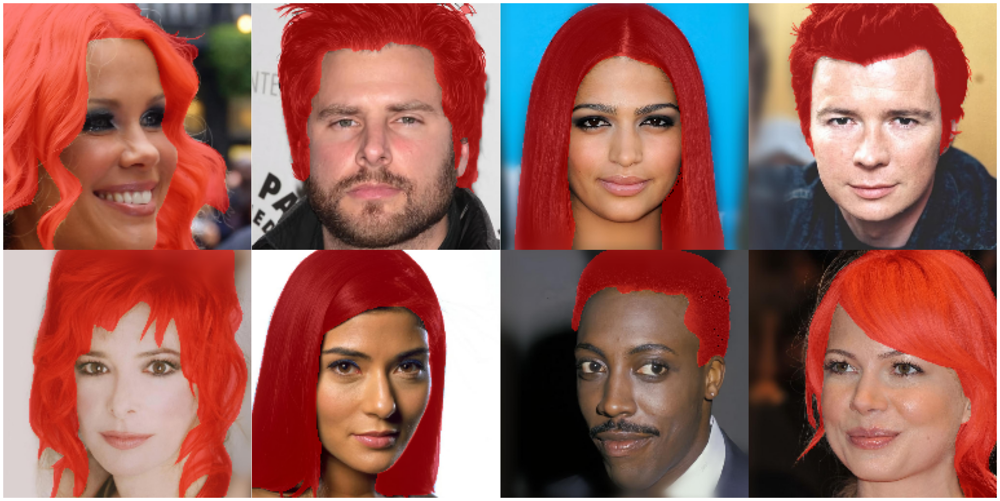

In [52]:
#Plotting Groud Truth
fig, axes = plt.subplots(2, 4,figsize=(30, 15))
for i, ax in enumerate(axes.flat):
    ax = display_image(test_images[i], ax=ax)
    colored_hair = apply_color(test_images[i],test_labels[i][...,0])
    display_image(colored_hair, ax=ax, alpha=0.5,cmap='gray')
plt.tight_layout(pad=0.1)
